In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

**Stitching 2 image**

In [ ]:
def showplt(image, title=None, pltnative=False):
    if pltnative:
        plt.imshow(image)
    else:
        plt.imshow(image[...,::-1])
    plt.title(title)
    plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()

def warpImages(img1, img2, H):
    rows1, cols1 = img1.shape[:2]
    rows2, cols2 = img2.shape[:2]

    list_of_points_1 = np.float32([
        [0,0],
        [0,rows1],
        [cols1,rows1],
        [cols1,0]
    ])
    list_of_points_1 = list_of_points_1.reshape(-1,1,2)

    temp_points = np.float32([
        [0,0],
        [0,rows2],
        [cols2,rows2],
        [cols2,0]
    ])
    temp_points = temp_points.reshape(-1,1,2)

    list_of_points_2 = cv2.perspectiveTransform(temp_points, H)

    list_of_points = np.concatenate((list_of_points_1, list_of_points_2), axis=0)

    ##Define boundaries:
    [x_min, y_min] = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(list_of_points.max(axis=0).ravel() + 0.5)

    translation_dist = [-x_min,-y_min]

    H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0,0,1]])

    output_img = cv2.warpPerspective(img2,
                                     H_translation.dot(H),
                                     (x_max - x_min, y_max - y_min))
    ## Paste the image:
    output_img[translation_dist[1]:rows1+translation_dist[1],
               translation_dist[0]:cols1+translation_dist[0]] = img1

    return output_img
#
def warp(img1, img2, min_match_count = 10):
    sift = cv2.SIFT_create()

    # Extract the keypoints and descriptors
    keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

    # Initialize parameters for Flann based matcher
    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)

    # Initialize the Flann based matcher object
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Compute the matches
    matches = flann.knnMatch(descriptors1, descriptors2, k=2)

    # Store all the good matches as per Lowe's ratio test
    good_matches = []
    for m1,m2 in matches:
        if m1.distance < 0.7*m2.distance:
            good_matches.append(m1)

    if len(good_matches) > min_match_count:
        src_pts = np.float32([ keypoints1[good_match.queryIdx].pt
                              for good_match in good_matches ]).reshape(-1,1,2)

        dst_pts = np.float32([ keypoints2[good_match.trainIdx].pt
                              for good_match in good_matches ]).reshape(-1,1,2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        result = warpImages(img2, img1, M)
        return result
        #cv2.imshow('Stitched output', result)
        #cv2.waitKey()
    else:
        print ("We don't have enough number of matches between the two images.")
        print ("Found only " + str(len(good_matches)) + " matches.")
        print ("We need at least " + str(min_match_count) + " matches.")

def save_image(directory, file_name, image):
    if not os.path.exists(directory):
            os.makedirs(directory)
    cv2.imwrite(directory+'/'+file_name, image)

In [ ]:
dim=(1024,768)
left=cv2.imread('/content/1.jpg',cv2.IMREAD_COLOR)
left=cv2.resize(left,dim,interpolation = cv2.INTER_AREA)   #ReSize to (1024,768)
right=cv2.imread('//content/2.jpg',cv2.IMREAD_COLOR)
right=cv2.resize(right,dim,interpolation = cv2.INTER_AREA) #ReSize to (1024,768)

images=[]
images.append(left)
images.append(right)

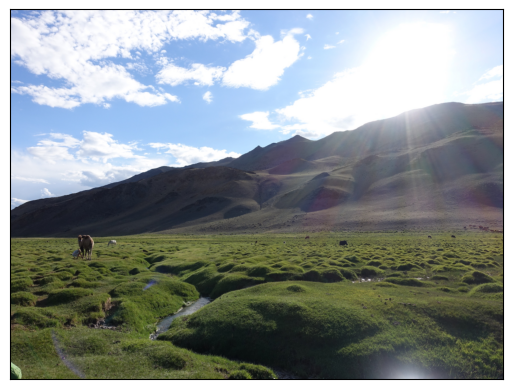

In [ ]:
showplt(left)

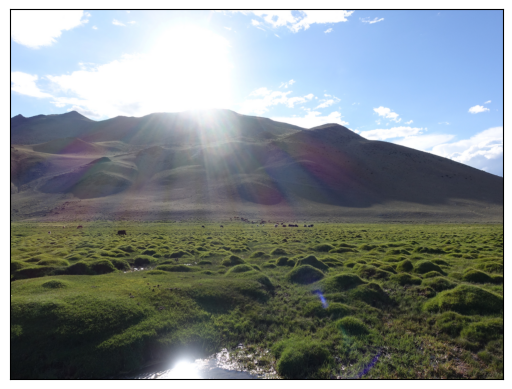

In [ ]:
showplt(right)

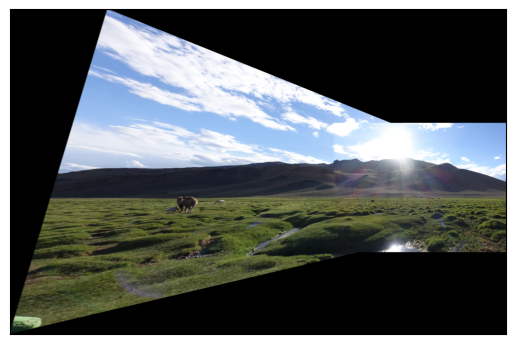

In [ ]:
pano = warp(left, right)
save_image('/content','image_1_2.jpg',pano)
showplt(pano)

**Stitching multi images**

In [21]:
import cv2
import numpy as np
import os

def ReadImage(ImageFolderPath):
    Images = []									# Input Images will be stored in this list.

    # Checking if path is of folder.
    if os.path.isdir(ImageFolderPath):                              # If path is of a folder contaning images.
        ImageNames = os.listdir(ImageFolderPath)
        ImageNames_Split = [[int(os.path.splitext(os.path.basename(ImageName))[0]), ImageName] for ImageName in ImageNames]
        ImageNames_Split = sorted(ImageNames_Split, key=lambda x:x[0])
        ImageNames_Sorted = [ImageNames_Split[i][1] for i in range(len(ImageNames_Split))]

        for i in range(len(ImageNames_Sorted)):                     # Getting all image's name present inside the folder.
            ImageName = ImageNames_Sorted[i]
            InputImage = cv2.imread(ImageFolderPath + "/" + ImageName)  # Reading images one by one.

            # Checking if image is read
            if InputImage is None:
                print("Not able to read image: {}".format(ImageName))
                exit(0)

            Images.append(InputImage)                               # Storing images.

    else:                                       # If it is not folder(Invalid Path).
        print("\nEnter valid Image Folder Path.\n")

    if len(Images) < 2:
        print("\nNot enough images found. Please provide 2 or more images.\n")
        exit(1)

    return Images

def Convert_xy(x, y):
  global center, f
  xt = ( f * np.tan( (x - center[0]) / f ) ) + center[0]
  yt = ( (y - center[1]) / np.cos( (x - center[0]) / f ) ) + center[1]
  return xt, yt

def ProjectOntoCylinder(InitialImage):
    global w, h, center, f
    h, w = InitialImage.shape[:2]
    center = [w // 2, h // 2]
    f = 1100       # 1100 field; 1000 Sun; 1500 Rainier; 1050 Helens

    # Creating a blank transformed image
    TransformedImage = np.zeros(InitialImage.shape, dtype=np.uint8)

    # Storing all coordinates of the transformed image in 2 arrays (x and y coordinates)
    AllCoordinates_of_ti =  np.array([np.array([i, j]) for i in range(w) for j in range(h)])
    ti_x = AllCoordinates_of_ti[:, 0]
    ti_y = AllCoordinates_of_ti[:, 1]

    # Finding corresponding coordinates of the transformed image in the initial image
    ii_x, ii_y = Convert_xy(ti_x, ti_y)

    # Rounding off the coordinate values to get exact pixel values (top-left corner)
    ii_tl_x = ii_x.astype(int)
    ii_tl_y = ii_y.astype(int)

    # Finding transformed image points whose corresponding
    # initial image points lies inside the initial image
    GoodIndices = (ii_tl_x >= 0) * (ii_tl_x <= (w-2)) * \
                  (ii_tl_y >= 0) * (ii_tl_y <= (h-2))

    # Removing all the outside points from everywhere
    ti_x = ti_x[GoodIndices]
    ti_y = ti_y[GoodIndices]

    ii_x = ii_x[GoodIndices]
    ii_y = ii_y[GoodIndices]

    ii_tl_x = ii_tl_x[GoodIndices]
    ii_tl_y = ii_tl_y[GoodIndices]

    # Bilinear interpolation
    dx = ii_x - ii_tl_x
    dy = ii_y - ii_tl_y

    weight_tl = (1.0 - dx) * (1.0 - dy)
    weight_tr = (dx)       * (1.0 - dy)
    weight_bl = (1.0 - dx) * (dy)
    weight_br = (dx)       * (dy)

    TransformedImage[ti_y, ti_x, :] = ( weight_tl[:, None] * InitialImage[ii_tl_y,     ii_tl_x,     :] ) + \
                                      ( weight_tr[:, None] * InitialImage[ii_tl_y,     ii_tl_x + 1, :] ) + \
                                      ( weight_bl[:, None] * InitialImage[ii_tl_y + 1, ii_tl_x,     :] ) + \
                                      ( weight_br[:, None] * InitialImage[ii_tl_y + 1, ii_tl_x + 1, :] )


    # Getting x coorinate to remove black region from right and left in the transformed image
    min_x = min(ti_x)

    # Cropping out the black region from both sides (using symmetricity)
    TransformedImage = TransformedImage[:, min_x : -min_x, :]

    return TransformedImage, ti_x-min_x, ti_y


In [26]:
def FindMatches(BaseImage, SecImage):
    # Using SIFT to find the keypoints and decriptors in the images
    Sift = cv2.SIFT_create()
    # Sift = cv2.ORB_create()
    BaseImage_kp, BaseImage_des = Sift.detectAndCompute(cv2.cvtColor(BaseImage, cv2.COLOR_BGR2GRAY), None)
    SecImage_kp, SecImage_des = Sift.detectAndCompute(cv2.cvtColor(SecImage, cv2.COLOR_BGR2GRAY), None)

    # Using Brute Force matcher to find matches.
    BF_Matcher = cv2.BFMatcher()
    InitialMatches = BF_Matcher.knnMatch(BaseImage_des, SecImage_des, k=2)

    # Applying ratio test and filtering out the good matches.
    GoodMatches = []
    for m, n in InitialMatches:
        if m.distance < 0.75 * n.distance:
            GoodMatches.append([m])

    return GoodMatches, BaseImage_kp, SecImage_kp



def FindHomography(Matches, BaseImage_kp, SecImage_kp):
    # If less than 4 matches found, exit the code.
    if len(Matches) < 4:
        print("\nNot enough matches found between the images.\n")
        exit(0)

    # Storing coordinates of points corresponding to the matches found in both the images
    BaseImage_pts = []
    SecImage_pts = []
    for Match in Matches:
        BaseImage_pts.append(BaseImage_kp[Match[0].queryIdx].pt)
        SecImage_pts.append(SecImage_kp[Match[0].trainIdx].pt)

    # Changing the datatype to "float32" for finding homography
    BaseImage_pts = np.float32(BaseImage_pts)
    SecImage_pts = np.float32(SecImage_pts)

    # Finding the homography matrix(transformation matrix).
    (HomographyMatrix, Status) = cv2.findHomography(SecImage_pts, BaseImage_pts, cv2.RANSAC, 4.0)

    return HomographyMatrix, Status


def GetNewFrameSizeAndMatrix(HomographyMatrix, Sec_ImageShape, Base_ImageShape):
    # Reading the size of the image
    (Height, Width) = Sec_ImageShape

    # Taking the matrix of initial coordinates of the corners of the secondary image
    # Stored in the following format: [[x1, x2, x3, x4], [y1, y2, y3, y4], [1, 1, 1, 1]]
    # Where (xi, yi) is the coordinate of the i th corner of the image.
    InitialMatrix = np.array([[0, Width - 1, Width - 1, 0],
                              [0, 0, Height - 1, Height - 1],
                              [1, 1, 1, 1]])

    # Finding the final coordinates of the corners of the image after transformation.
    # NOTE: Here, the coordinates of the corners of the frame may go out of the
    # frame(negative values). We will correct this afterwards by updating the
    # homography matrix accordingly.
    FinalMatrix = np.dot(HomographyMatrix, InitialMatrix)

    [x, y, c] = FinalMatrix
    x = np.divide(x, c)
    y = np.divide(y, c)

    # Finding the dimentions of the stitched image frame and the "Correction" factor
    min_x, max_x = int(round(min(x))), int(round(max(x)))
    min_y, max_y = int(round(min(y))), int(round(max(y)))

    New_Width = max_x
    New_Height = max_y
    Correction = [0, 0]
    if min_x < 0:
        New_Width -= min_x
        Correction[0] = abs(min_x)
    if min_y < 0:
        New_Height -= min_y
        Correction[1] = abs(min_y)

    # Again correcting New_Width and New_Height
    # Helpful when secondary image is overlaped on the left hand side of the Base image.
    if New_Width < Base_ImageShape[1] + Correction[0]:
        New_Width = Base_ImageShape[1] + Correction[0]
    if New_Height < Base_ImageShape[0] + Correction[1]:
        New_Height = Base_ImageShape[0] + Correction[1]

    # Finding the coordinates of the corners of the image if they all were within the frame.
    x = np.add(x, Correction[0])
    y = np.add(y, Correction[1])
    OldInitialPoints = np.float32([[0, 0],
                                   [Width - 1, 0],
                                   [Width - 1, Height - 1],
                                   [0, Height - 1]])
    NewFinalPonts = np.float32(np.array([x, y]).transpose())

    # Updating the homography matrix. Done so that now the secondary image completely
    # lies inside the frame
    HomographyMatrix = cv2.getPerspectiveTransform(OldInitialPoints, NewFinalPonts)

    return [New_Height, New_Width], Correction, HomographyMatrix



In [23]:
def StitchImages(BaseImage, SecImage):
  # Applying Cylindrical projection on SecImage
  SecImage_Cyl, mask_x, mask_y = ProjectOntoCylinder(SecImage)
  # Getting SecImage Mask
  SecImage_Mask = np.zeros(SecImage_Cyl.shape, dtype=np.uint8)
  SecImage_Mask[mask_y, mask_x, :] = 255
  # Finding matches between the 2 images and their keypoints
  Matches, BaseImage_kp, SecImage_kp = FindMatches(BaseImage, SecImage_Cyl)

  # Finding homography matrix.
  HomographyMatrix, Status = FindHomography(Matches, BaseImage_kp, SecImage_kp)
  # Finding size of new frame of stitched images and updating
  # the homography matrix
  NewFrameSize, Correction, HomographyMatrix = GetNewFrameSizeAndMatrix(HomographyMatrix, SecImage_Cyl.shape[:2],  BaseImage.shape[:2])
  SecImage_Transformed = cv2.warpPerspective(SecImage_Cyl, HomographyMatrix, (NewFrameSize[1], NewFrameSize[0]))
  SecImage_Transformed_Mask = cv2.warpPerspective(SecImage_Mask, HomographyMatrix, (NewFrameSize[1], NewFrameSize[0]))

  BaseImage_Transformed = np.zeros((NewFrameSize[0], NewFrameSize[1], 3), dtype=np.uint8)

  BaseImage_Transformed [Correction[1]:Correction[1]+BaseImage.shape[0], Correction[0]:Correction[0]+BaseImage.shape[1]] = BaseImage

  StitchedImage = cv2.bitwise_or(SecImage_Transformed,

  cv2.bitwise_and(BaseImage_Transformed,
  cv2.bitwise_not(SecImage_Transformed_Mask)))

  return StitchedImage

In [27]:
import time

def main():
  # Start the timer
  start_time = time.time()

  # Read the images from the folder
  Images = ReadImage("/content/Image")

  # Project the base image onto a cylinder
  BaseImage, _, _  = ProjectOntoCylinder(Images[0])

  # Stitch the remaining images with the base image
  for i in range(1, len(Images)):
    StitchedImage = StitchImages(BaseImage, Images[i])

    BaseImage = StitchedImage.copy()

  # Writing the stitched image to a file
  cv2.imwrite("/content/image_stitched.jpg", BaseImage)

  # Stop the timer
  end_time = time.time()

  # Calculate the time taken to generate the panorama
  panorama_generation_time = end_time - start_time

  # Print the time taken to generate the panorama
  print("Panorama generation time: {} seconds".format(panorama_generation_time))

if __name__ == "__main__":
  main()


Panorama generation time: 66.60206699371338 seconds


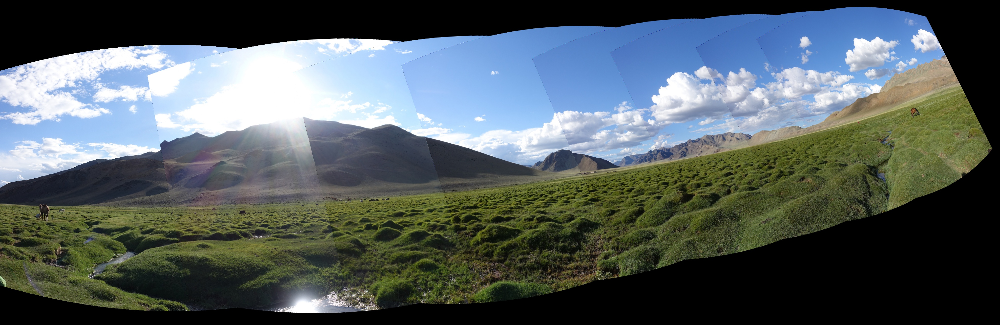

In [6]:
from google.colab.patches import cv2_imshow
img = cv2.imread('/content/image_stitched.jpg')
cv2_imshow(img)

In [7]:
height, width, channels = img.shape
print("Image size: {}x{} pixels".format(width, height))

Image size: 4048x1317 pixels


In [8]:
img1 = cv2.imread('/content/Image/1.jpg')
height, width, channels = img1.shape
print("Image size: {}x{} pixels".format(width, height))

Image size: 1620x1080 pixels


In [4]:
def imwrite_multi(folder_name, images):
  if not os.path.exists(folder_name):
    os.makedirs(folder_name)

  for i in range(len(images)):
    cv2.imwrite(os.path.join(folder_name, f"{i}.jpg"), images[i])

In [5]:
dim = (640, 640)
resize_images = []

# Read the images from the folder
for i in range(1, 9):
  image = cv2.imread(f"/content/Image/{i}.jpg", cv2.IMREAD_COLOR)
  image = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
  resize_images.append(image)
  height, width, channels = image.shape
  print("Image size: {}x{} pixels".format(width, height))

new_folder_name = "My_resized_images"
imwrite_multi(f"/content/{new_folder_name}", resize_images)


Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels


In [11]:
!ls /content

Image  image_stitched.jpg  My_resized_images  sample_data


In [ ]:
import time
def main():
  # Start the timer
  start_time = time.time()

  # Read the images from the folder
  Images = ReadImage("/content/My_resized_images")

  # Project the base image onto a cylinder
  BaseImage, _, _  = ProjectOntoCylinder(Images[0])

  # Stitch the remaining images with the base image
  for i in range(1, len(Images)):
    StitchedImage = StitchImages(BaseImage, Images[i])
    BaseImage = StitchedImage.copy()

  # Writing the stitched image to a file
  cv2.imwrite("/content/image_stitched_2.jpg", BaseImage)

  # Stop the timer
  end_time = time.time()

  # Calculate the time taken to generate the panorama
  panorama_generation_time = end_time - start_time

  # Print the time taken to generate the panorama
  print("Panorama generation time: {} seconds".format(panorama_generation_time))

if __name__ == "__main__":
  main()

In [ ]:
img_2 = cv2.imread('/content/image_stitched._2jpg')
cv2_imshow(img_2)

Your Panorama is ready!!!
Panorama generation time: 1.603752613067627 seconds


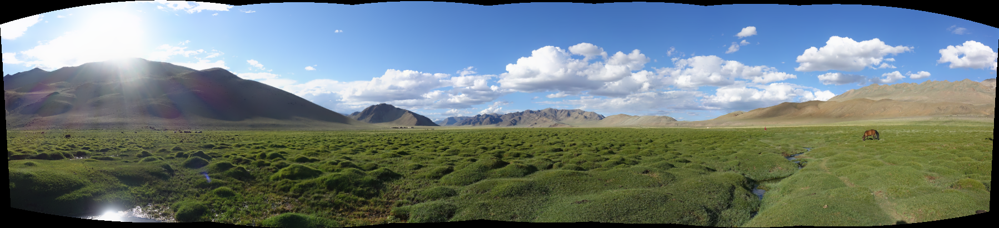

In [8]:
import cv2
from google.colab.patches import cv2_imshow
import time

image_paths=['/content/Image/1.jpg', '/content/Image/2.jpg', '/content/Image/3.jpg', '/content/Image/4.jpg', '/content/Image/5.jpg', '/content/Image/6.jpg',
               '/content/Image/7.jpg', '/content/Image/8.jpg']
# initialized a list of images
imgs = []

for i in range(len(image_paths)):
	imgs.append(cv2.imread(image_paths[i]))
	imgs[i]=cv2.resize(imgs[i],(0,0),fx=0.4,fy=0.4)

start_time = time.time()

stitchy=cv2.Stitcher.create()
(dummy,output)=stitchy.stitch(imgs)
end_time = time.time()

if dummy != cv2.STITCHER_OK:
	print("stitching ain't successful")
else:
	print('Your Panorama is ready!!!')

panorama_generation_time = end_time - start_time
print("Panorama generation time: {} seconds".format(panorama_generation_time))

# final output
cv2_imshow(output)



Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Image size: 640x640 pixels
Your Panorama is ready!!!
Panorama generation time: 1.5362403392791748 seconds


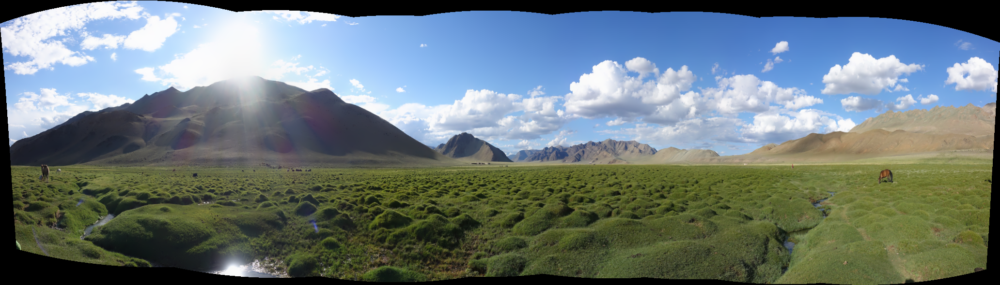

In [20]:
image_paths = ['/content/Image/1.jpg', '/content/Image/2.jpg', '/content/Image/3.jpg', '/content/Image/4.jpg', '/content/Image/5.jpg', '/content/Image/6.jpg',
               '/content/Image/7.jpg', '/content/Image/8.jpg']
# Initialize a list of images
imgs = []
dim = (640, 640)

for i in range(len(image_paths)):
    imgs.append(cv2.imread(image_paths[i], cv2.IMREAD_COLOR))
    imgs[i] = cv2.resize(imgs[i], dim, interpolation=cv2.INTER_AREA)
    height, width, channels = imgs[i].shape
    print("Image size: {}x{} pixels".format(width, height))

start_time = time.time()

stitchy = cv2.Stitcher.create()
(dummy, output) = stitchy.stitch(imgs)
end_time = time.time()

if dummy != cv2.STITCHER_OK:
    print("Stitching ain't successful")
else:
    print('Your Panorama is ready!!!')

panorama_generation_time = end_time - start_time
print("Panorama generation time: {} seconds".format(panorama_generation_time))

# Final output
cv2_imshow(output)
